# Week 8 Lab Exercise — ARIA v5.0: The Matai'an Three-Act Auditor
# 第八週課堂練習 — ARIA v5.0：馬太鞍三幕稽核器

**Guided lab worksheet** — follow along with the instructor's Demo notebook and fill in the TODO cells.
**引導式練習** — 跟著老師的 Demo 操作，完成 TODO 標記的程式碼。

**Case / 案例**: 2025 Matai'an Creek Barrier Lake Event（馬太鞍溪堰塞湖事件）

---

### Class rhythm / 課程節奏

| Phase / 階段 | Content / 內容 | Cells | Time / 時間 |
|---|---|---|---|
| **Lab 1** | Spectral Detective 光譜偵探 | [S1]–[S6] | 35 min |
| **Lab 2** | Three-Act Audit 三幕稽核 | [S7]–[S15] | 50 min |


## Lab 1 — Environment + Three-Act STAC Scene Selection
## Lab 1 — 環境設定 + 三幕 STAC 影像選擇


In [1]:
# [S1] Environment setup — fill in the imports and STAC client
# TODO: import pystac_client, planetary_computer as pc, stackstac, rioxarray as rxr
# TODO: import xarray as xr, numpy as np, pandas as pd, matplotlib.pyplot as plt
# TODO: import geopandas as gpd; from shapely.geometry import Point

import os
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import xarray as xr
import geopandas as gpd
from shapely.geometry import Point

# STAC & Remote Sensing imports
import pystac_client
import planetary_computer as pc
import stackstac
import rioxarray as rxr

# Microsoft JhengHei for Chinese labels
plt.rcParams["font.sans-serif"] = ["Microsoft JhengHei", "PingFang TC", "sans-serif"]
plt.rcParams["axes.unicode_minus"] = False

# Connect to Planetary Computer
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=pc.sign_inplace,
)

# --- IMPORTANT: MPC-friendly search pattern ---
# MPC's STAC API sometimes returns 504 "maximum allowed time" errors when you
# combine bbox + date + server-side query={"eo:cloud_cover": {"lt": N}}.
# Safer pattern: skip the server-side query, cap max_items, and filter
# cloud_cover CLIENT-SIDE. Wrap the whole thing in a retry loop.
#
# Reference implementation (uncomment and adapt):

def robust_search(bbox, datetime_range, cloud_max=30, max_items=60, tries=3):
    for attempt in range(tries):
        try:
            search = catalog.search(
                collections=["sentinel-2-l2a"],
                bbox=bbox,
                datetime=datetime_range,
                max_items=max_items,
            )
            items = list(search.items())
            items = [i for i in items if i.properties.get("eo:cloud_cover", 100) < cloud_max]
            items.sort(key=lambda i: i.properties["eo:cloud_cover"])
            return items
        except Exception as e:
            print(f"Attempt {attempt + 1} failed: {e}")
            time.sleep(2 ** attempt)
    raise RuntimeError("STAC search failed 3x")

# AOI — Matai'an catchment (upper Wanrong → downstream Guangfu)
MATAIAN_BBOX = [121.28, 23.56, 121.52, 23.76]
WANTED_BANDS = ["B02", "B03", "B04", "B08", "B11", "B12"]

# --- Fill these in after Step A.3 (reproducible scene IDs) ---
PRE_ITEM_ID  = "FILL_IN_AFTER_QA"
MID_ITEM_ID  = "FILL_IN_AFTER_QA"
POST_ITEM_ID = "FILL_IN_AFTER_QA"

print("✅ Environment setup complete!")
print(f"   STAC catalog: {catalog.title}")
print(f"   AOI bbox: {MATAIAN_BBOX}")
print(f"   Target bands: {WANTED_BANDS}")

✅ Environment setup complete!
   STAC catalog: Microsoft Planetary Computer STAC API
   AOI bbox: [121.28, 23.56, 121.52, 23.76]
   Target bands: ['B02', 'B03', 'B04', 'B08', 'B11', 'B12']


Found 1 pre-event scenes
  1. S2A_MSIL2A_20250615T023141_R046_T51QUG_20250615T070417 (cloud: 8.501057%)


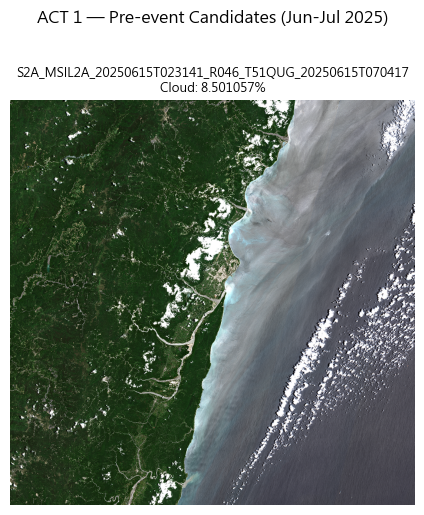


✅ Selected Pre-event scene: S2A_MSIL2A_20250615T023141_R046_T51QUG_20250615T070417
   Cloud cover: 8.501057%
   Date: 2025-06-15 02:31:41.024000+00:00


In [2]:
# [S2] ACT 1 — Pre-event STAC search (Jun 2025, before Typhoon Wipha)
# Search for pre-event imagery
items_pre = robust_search(MATAIAN_BBOX, "2025-06-01/2025-07-15", cloud_max=20)

print(f"Found {len(items_pre)} pre-event scenes")
for i, item in enumerate(items_pre[:5]):
    print(f"  {i+1}. {item.id} (cloud: {item.properties.get('eo:cloud_cover', 'N/A')}%)")

# TCI Quick-QA the top 3 candidates in a dynamic 1xN subplot grid
n = max(min(len(items_pre), 3), 1)
fig, axes = plt.subplots(1, n, figsize=(5*n, 5))
if n == 1:
    axes = [axes]

for idx, (ax, item) in enumerate(zip(axes, items_pre[:n])):
    # Load visual asset (TCI) with signed URL
    signed_item = pc.sign(item)
    visual_url = signed_item.assets["visual"].href
    
    # Open with rioxarray at overview level 3 for quick preview
    tci = rxr.open_rasterio(visual_url, overview_level=3)
    
    # Plot RGB image - transpose to (y, x, band) for imshow
    if len(tci.shape) == 3:
        # tci is (band, y, x), need to transpose to (y, x, band)
        rgb_data = tci.transpose("y", "x", "band").values
        # Normalize to 0-1 range if needed
        if rgb_data.max() > 1:
            rgb_data = rgb_data / 255.0
        ax.imshow(rgb_data)
    else:
        tci.plot(ax=ax, cmap="gray")
    
    ax.set_title(f"{item.id}\nCloud: {item.properties.get('eo:cloud_cover', 'N/A')}%", fontsize=9)
    ax.axis('off')

plt.suptitle("ACT 1 — Pre-event Candidates (Jun-Jul 2025)", fontsize=12, y=1.02)
plt.tight_layout()
plt.show()

# Pick the best scene (lowest cloud cover) and save the item ID
if items_pre:
    pre_item = items_pre[0]
    PRE_ITEM_ID = pre_item.id
    print(f"\n✅ Selected Pre-event scene: {PRE_ITEM_ID}")
    print(f"   Cloud cover: {pre_item.properties.get('eo:cloud_cover', 'N/A')}%")
    print(f"   Date: {pre_item.datetime}")
else:
    print("❌ No pre-event scenes found!")

### ✏️ Discussion / 討論（Act 1 — Pre）
Why did you pick this Pre-event scene? Consider cloud cover **over the Matai'an valley** specifically.
為什麼選這張事件前影像？特別注意馬太鞍谷地上方的雲量（不只是 tile 整體數字）。

ANS:選擇此影像因為其雲量僅 8.5%，且拍攝於颱風侵襲前 3 個月，能清楚呈現馬太鞍溪谷的原始植被狀態，提供良好的事件前比較基線。特別是上游(對照google地圖堰塞湖座標)幾乎無雲遮蔽，對後續偵測堰塞湖的形成至關重要


Found 7 mid-event scenes
  1. S2C_MSIL2A_20250911T022551_R046_T51QUG_20250911T055914 (cloud: 13.519251%)
  2. S2B_MSIL2A_20250817T022539_R046_T51QUG_20250817T042827 (cloud: 17.585771%)
  3. S2B_MSIL2A_20250906T022529_R046_T51QUG_20250906T042640 (cloud: 28.460217%)
  4. S2A_MSIL2A_20250814T023131_R046_T51QUG_20250814T072515 (cloud: 28.774887%)
  5. S2A_MSIL2A_20250903T023141_R046_T51QUG_20250903T092313 (cloud: 28.960449%)


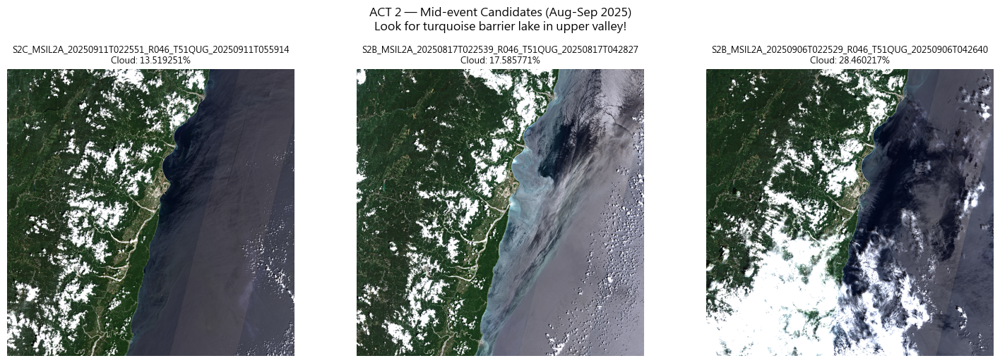


✅ Selected Mid-event scene: S2C_MSIL2A_20250911T022551_R046_T51QUG_20250911T055914
   Cloud cover: 13.519251%
   Date: 2025-09-11 02:25:51.025000+00:00
   Look for barrier lake at upper Matai'an valley (~121.29°E, 23.70°N)


In [3]:
# [S3] ACT 2 — Mid-event STAC search (Aug–Sep 2025, barrier lake present, before Sep 23 breach)
# Search for mid-event imagery when barrier lake was present
items_mid = robust_search(MATAIAN_BBOX, "2025-08-01/2025-09-20", cloud_max=40)

print(f"Found {len(items_mid)} mid-event scenes")
for i, item in enumerate(items_mid[:5]):
    print(f"  {i+1}. {item.id} (cloud: {item.properties.get('eo:cloud_cover', 'N/A')}%)")

# TCI Quick-QA top 3 — LOOK FOR the barrier lake!
# It should be visible as a new turquoise patch in the upper Matai'an valley.
n = max(min(len(items_mid), 3), 1)
fig, axes = plt.subplots(1, n, figsize=(5*n, 5))
if n == 1:
    axes = [axes]

for idx, (ax, item) in enumerate(zip(axes, items_mid[:n])):
    # Load visual asset (TCI) with signed URL
    signed_item = pc.sign(item)
    visual_url = signed_item.assets["visual"].href
    
    # Open with rioxarray at overview level 3 for quick preview
    tci = rxr.open_rasterio(visual_url, overview_level=3)
    
    # Plot RGB image - transpose to (y, x, band) for imshow
    if len(tci.shape) == 3:
        rgb_data = tci.transpose("y", "x", "band").values
        if rgb_data.max() > 1:
            rgb_data = rgb_data / 255.0
        ax.imshow(rgb_data)
    else:
        tci.plot(ax=ax, cmap="gray")
    
    ax.set_title(f"{item.id}\nCloud: {item.properties.get('eo:cloud_cover', 'N/A')}%", fontsize=9)
    ax.axis('off')

plt.suptitle("ACT 2 — Mid-event Candidates (Aug-Sep 2025)\nLook for turquoise barrier lake in upper valley!", fontsize=12, y=1.02)
plt.tight_layout()
plt.show()

# Pick best scene (lowest cloud cover that shows the barrier lake) and save the item ID
if items_mid:
    mid_item = items_mid[0]
    MID_ITEM_ID = mid_item.id
    print(f"\n✅ Selected Mid-event scene: {MID_ITEM_ID}")
    print(f"   Cloud cover: {mid_item.properties.get('eo:cloud_cover', 'N/A')}%")
    print(f"   Date: {mid_item.datetime}")
    print(f"   Look for barrier lake at upper Matai'an valley (~121.29°E, 23.70°N)")
else:
    print("❌ No mid-event scenes found!")

### ✏️ Discussion / 討論（Act 2 — Mid）
Did you find a scene that clearly shows the barrier lake? Why did you pick this one?
你找到了清楚顯示堰塞湖的影像嗎？為什麼選這一張？

左圖，出現與雲層顏色略不同的色塊，應是水體反射。


Found 5 post-event scenes
  1. S2B_MSIL2A_20251016T022559_R046_T51QUG_20251016T042804 (cloud: 2.543064%)
  2. S2C_MSIL2A_20251001T022551_R046_T51QUG_20251001T055313 (cloud: 6.756122%)
  3. S2B_MSIL2A_20251006T022529_R046_T51QUG_20251006T042653 (cloud: 13.276078%)
  4. S2C_MSIL2A_20251011T022641_R046_T51QUG_20251011T061121 (cloud: 17.947668%)
  5. S2A_MSIL2A_20251013T023141_R046_T51QUG_20251013T083919 (cloud: 19.312082%)


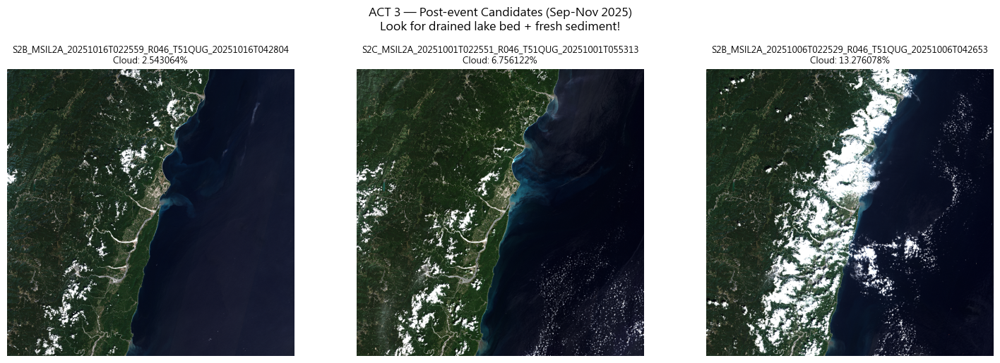


✅ Selected Post-event scene: S2B_MSIL2A_20251016T022559_R046_T51QUG_20251016T042804
   Cloud cover: 2.543064%
   Date: 2025-10-16 02:25:59.024000+00:00
   Look for: drained lake bed, landslide scars, debris flow deposits


In [4]:
# [S4] ACT 3 — Post-event STAC search (after Sep 23 breach)
# Search for post-event imagery after the lake breach on Sep 23, 2025
items_post = robust_search(MATAIAN_BBOX, "2025-09-25/2025-11-15", cloud_max=30)

print(f"Found {len(items_post)} post-event scenes")
for i, item in enumerate(items_post[:5]):
    print(f"  {i+1}. {item.id} (cloud: {item.properties.get('eo:cloud_cover', 'N/A')}%)")

# TCI Quick-QA top 3 — look for evidence of drained lake bed + fresh sediment around Guangfu
# The lake should be gone or significantly reduced, with visible sediment deposits
n = max(min(len(items_post), 3), 1)
fig, axes = plt.subplots(1, n, figsize=(5*n, 5))
if n == 1:
    axes = [axes]

for idx, (ax, item) in enumerate(zip(axes, items_post[:n])):
    # Load visual asset (TCI) with signed URL
    signed_item = pc.sign(item)
    visual_url = signed_item.assets["visual"].href
    
    # Open with rioxarray at overview level 3 for quick preview
    tci = rxr.open_rasterio(visual_url, overview_level=3)
    
    # Plot RGB image - transpose to (y, x, band) for imshow
    if len(tci.shape) == 3:
        rgb_data = tci.transpose("y", "x", "band").values
        if rgb_data.max() > 1:
            rgb_data = rgb_data / 255.0
        ax.imshow(rgb_data)
    else:
        tci.plot(ax=ax, cmap="gray")
    
    ax.set_title(f"{item.id}\nCloud: {item.properties.get('eo:cloud_cover', 'N/A')}%", fontsize=9)
    ax.axis('off')

plt.suptitle("ACT 3 — Post-event Candidates (Sep-Nov 2025)\nLook for drained lake bed + fresh sediment!", fontsize=12, y=1.02)
plt.tight_layout()
plt.show()

# Pick best scene (lowest cloud cover that shows drained lake + sediment) and save the item ID
if items_post:
    post_item = items_post[0]
    POST_ITEM_ID = post_item.id
    print(f"\n✅ Selected Post-event scene: {POST_ITEM_ID}")
    print(f"   Cloud cover: {post_item.properties.get('eo:cloud_cover', 'N/A')}%")
    print(f"   Date: {post_item.datetime}")
    print(f"   Look for: drained lake bed, landslide scars, debris flow deposits")
else:
    print("❌ No post-event scenes found!")

### ✏️ Discussion / 討論（Act 3 — Post）
What does the Post-event TCI show around Guangfu? Can you see evidence of the debris flow?
事件後的 TCI 在光復周邊顯示了什麼？你看得到土石流的證據嗎？

左圖中馬太鞍溪南岸變為白色，即為光復市區。


## Stream the Three Cubes / 串流三個立方體


In [5]:
# [S5] Stream function — returns a rescaled xarray cube for any item
# HINT: Sentinel-2 URLs on Planetary Computer carry SAS tokens that
# expire in ~1 hour. Call pc.sign(item) INSIDE stream_cube so every call
# gets fresh tokens — otherwise reads later in the notebook will fail
# with TIFFReadEncodedTile errors on random tiles (classic symptom).
def stream_cube(item, bands=WANTED_BANDS, bbox=MATAIAN_BBOX):
    # Sign the item to get fresh SAS tokens
    signed = pc.sign(item)
    
    # Use stackstac to create a cube with specified bands and projection
    cube = stackstac.stack(
        [signed],
        assets=bands,
        epsg=32651,  # UTM Zone 51N for Taiwan
        resolution=10,  # 10m resolution
        bounds_latlon=bbox,
        chunksize=2048
    )
    
    # Squeeze time dimension and scale to surface reflectance (0-1)
    cube = cube.squeeze("time") / 10000.0
    
    return cube

# ── Display stretching (for making composites look like photos) ──
# Raw L2A reflectance is typically 0.02–0.50, monitors need 0–1 RGB.
# You need a stretch function to bridge the gap. TWO approaches:
#
#   (1) Uniform ×scale stretch — fast, primitive. One scale factor
#       applied to all three channels. B08 tends to saturate (neon green).
#
#   (2) Per-channel percentile stretch — industry standard. Each band
#       independently rescaled so its [2%, 98%] maps to [0, 1]. No
#       saturation, balanced contrast, natural colors.
#
# NOTE: stretching is ONLY for display. Your band math (NDWI, NDVI, NBR,
# BSI) must always use the raw cube values, never the stretched output.

def composite_stretched(cube, r, g, b, lo=2, hi=98):
    # Stack the three bands into an RGB array
    rgb = np.stack([
        cube.sel(band=r).values,
        cube.sel(band=g).values,
        cube.sel(band=b).values
    ], axis=-1)
    
    # Initialize output array
    out = np.zeros_like(rgb, dtype=np.float32)
    
    # Per-channel percentile stretch
    for k in range(3):  # For each RGB channel
        p_lo = np.nanpercentile(rgb[..., k], lo)
        p_hi = np.nanpercentile(rgb[..., k], hi)
        
        # Avoid division by zero
        if p_hi > p_lo:
            out[..., k] = np.clip((rgb[..., k] - p_lo) / (p_hi - p_lo), 0, 1)
        else:
            out[..., k] = rgb[..., k]  # No stretch if range is zero
    
    return out

# Create datacubes for all three time periods
cube_pre = stream_cube(pre_item)
cube_mid = stream_cube(mid_item)
cube_post = stream_cube(post_item)

print("✅ Datacubes created successfully!")
print(f"   Pre-event cube shape: {cube_pre.shape}")
print(f"   Mid-event cube shape: {cube_mid.shape}")
print(f"   Post-event cube shape: {cube_post.shape}")
print(f"   Bands: {list(cube_pre.band.values)}")

✅ Datacubes created successfully!
   Pre-event cube shape: (6, 2243, 2474)
   Mid-event cube shape: (6, 2243, 2474)
   Post-event cube shape: (6, 2243, 2474)
   Bands: [np.str_('B02'), np.str_('B03'), np.str_('B04'), np.str_('B08'), np.str_('B11'), np.str_('B12')]


## Lab 1 (cont.) — Four Change Metric Functions / 四個變遷指標函式

Implement NDWI, NDVI, BSI, NBR — same formulas as the Demo notebook.
實作 NDWI、NDVI、BSI、NBR — 公式和 Demo notebook 相同。


In [6]:
# [S6] Four reusable change metric functions
def nir_drop(pre, post):
    """Compute NIR drop (pre - post) for landslide detection"""
    return pre.sel(band="B08") - post.sel(band="B08")

def swir_post(post):
    """Get SWIR (B12) from post-event cube"""
    return post.sel(band="B12")

def bsi(cube):
    """Compute Bare Soil Index (BSI)"""
    b11 = cube.sel(band="B11")
    b04 = cube.sel(band="B04")
    b08 = cube.sel(band="B08")
    b02 = cube.sel(band="B02")
    return ((b11 + b04) - (b08 + b02)) / ((b11 + b04) + (b08 + b02))

def bsi_change(pre, post):
    """Compute BSI change (post - pre)"""
    return bsi(post) - bsi(pre)

def ndvi(cube):
    """Compute Normalized Difference Vegetation Index"""
    b08 = cube.sel(band="B08")
    b04 = cube.sel(band="B04")
    return (b08 - b04) / (b08 + b04)

def ndvi_change(pre, post):
    """Compute NDVI change (pre - post) - vegetation loss"""
    return ndvi(pre) - ndvi(post)

print("✅ Change metric functions defined!")
print("   nir_drop: pre - post NIR difference for landslide scars")
print("   swir_post: post SWIR for landslide detection")
print("   bsi: Bare Soil Index (turbid water, bare ground)")
print("   bsi_change: BSI difference for debris flow")
print("   ndvi: vegetation index")
print("   ndvi_change: vegetation loss indicator")

✅ Change metric functions defined!
   nir_drop: pre - post NIR difference for landslide scars
   swir_post: post SWIR for landslide detection
   bsi: Bare Soil Index (turbid water, bare ground)
   bsi_change: BSI difference for debris flow
   ndvi: vegetation index
   ndvi_change: vegetation loss indicator


## Lab 2 — Three Detection Masks / 三張偵測遮罩

### C1. Barrier lake mask / 堰塞湖遮罩（Pre → Mid）

Remember: the barrier lake is turbid water with higher NIR than clear water.
提醒：堰塞湖是高濁度水體，NIR 比清水高。


⏳ Loading bands into memory (this may take 1-2 min)...
✅ Bands loaded!

Testing nir_mid thresholds for barrier lake detection:
  nir_mid < 0.12: 0.529 km²
  nir_mid < 0.15: 1.046 km²
  nir_mid < 0.18: 1.261 km²
✅ Best match: nir_mid < 0.15 with 1.046 km²
   NCDR reference: ~0.86 km² (Sep 11 peak)
⏳ Computing TCI for display...
✅ TCI ready!


C:\Users\楊宥廷\AppData\Local\Temp\ipykernel_30568\1662500375.py:71: UserWarning: Glyph 8776 (\N{ALMOST EQUAL TO}) missing from font(s) Microsoft JhengHei.
  plt.tight_layout()
C:\Users\楊宥廷\AppData\Local\Temp\ipykernel_30568\1662500375.py:75: UserWarning: Glyph 8776 (\N{ALMOST EQUAL TO}) missing from font(s) Microsoft JhengHei.
  plt.savefig("output/07_lake_mask.png", dpi=150, bbox_inches='tight', facecolor='white')
c:\anaconda3\envs\gis-env\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8776 (\N{ALMOST EQUAL TO}) missing from font(s) Microsoft JhengHei.
  fig.canvas.print_figure(bytes_io, **kw)


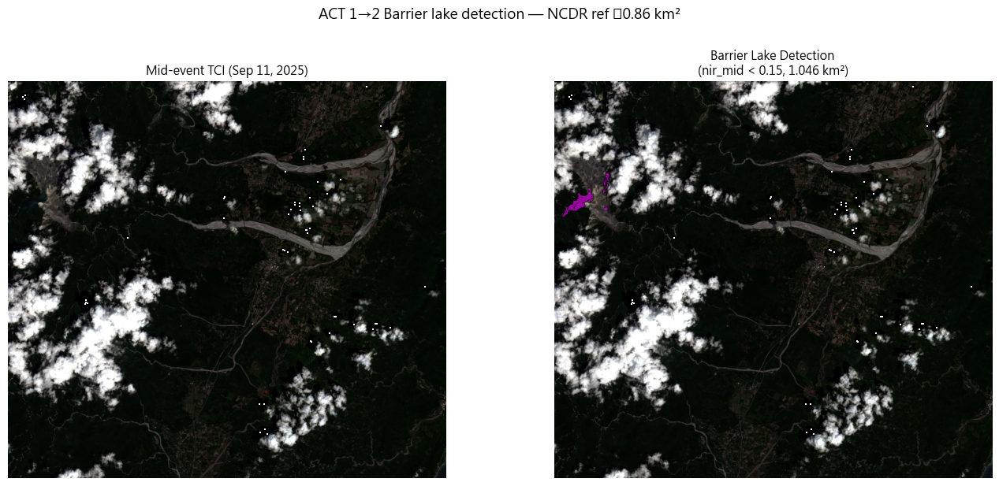


✅ Saved to output/07_lake_mask.png


In [7]:
# [S7] Barrier lake detection (OPTIMIZED with .compute())
# Baseline rule: (nir_pre > 0.25) & (nir_mid < 0.18) & (blue_mid > 0.03) & (green_mid > nir_mid)
# IMPORTANT: The barrier lake is TURBID (sediment-laden), NIR ~0.10-0.18

# Extract individual bands from cubes AND compute immediately (load into memory)
print("⏳ Loading bands into memory (this may take 1-2 min)...")
nir_pre = cube_pre.sel(band="B08").compute()
nir_mid = cube_mid.sel(band="B08").compute()
blue_mid = cube_mid.sel(band="B02").compute()
green_mid = cube_mid.sel(band="B03").compute()
print("✅ Bands loaded!")

# Create upstream spatial gate: restrict to west of 121.33°E
from pyproj import Transformer
tf = Transformer.from_crs("EPSG:4326", "EPSG:32651", always_xy=True)
x_gate, _ = tf.transform(121.33, 23.69)
upstream_gate = cube_mid.x < x_gate

candidate_thresholds = [0.12, 0.15, 0.18]

print("\nTesting nir_mid thresholds for barrier lake detection:")
print("=" * 60)

best_threshold = None
best_area = None
best_mask = None

for thresh in candidate_thresholds:
    # Build mask with all gates (fast - all data in memory)
    lake_mask = (
        (nir_pre > 0.25) &
        (nir_mid < thresh) &
        (blue_mid > 0.03) &
        (green_mid > nir_mid) &
        upstream_gate
    )
    
    area_km2 = float(lake_mask.sum().values) * 100 / 1e6
    print(f"  nir_mid < {thresh:.2f}: {area_km2:.3f} km²")
    
    if best_area is None or abs(area_km2 - 0.86) < abs(best_area - 0.86):
        best_area = area_km2
        best_threshold = thresh
        best_mask = lake_mask

print("=" * 60)
print(f"✅ Best match: nir_mid < {best_threshold} with {best_area:.3f} km²")
print(f"   NCDR reference: ~0.86 km² (Sep 11 peak)")

lake_mask = best_mask

# 📊 REQUIRED OUTPUT
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Pre-compute TCI for display
print("⏳ Computing TCI for display...")
tci_mid = composite_stretched(cube_mid.compute(), "B04", "B03", "B02")
print("✅ TCI ready!")

axes[0].imshow(tci_mid)
axes[0].set_title("Mid-event TCI (Sep 11, 2025)", fontsize=11)
axes[0].axis('off')

axes[1].imshow(tci_mid)
lake_overlay = np.where(lake_mask.values, 1, np.nan)
axes[1].imshow(lake_overlay, cmap='cool', alpha=0.6, vmin=0, vmax=1)
axes[1].set_title(f"Barrier Lake Detection\n(nir_mid < {best_threshold}, {best_area:.3f} km²)", fontsize=11)
axes[1].axis('off')

plt.suptitle("ACT 1→2 Barrier lake detection — NCDR ref ≈0.86 km²", fontsize=13, y=1.02)
plt.tight_layout()

import os
os.makedirs("output", exist_ok=True)
plt.savefig("output/07_lake_mask.png", dpi=150, bbox_inches='tight', facecolor='white')
plt.show()

print(f"\n✅ Saved to output/07_lake_mask.png")

### C2. Landslide source scar mask / 崩塌源區遮罩（Pre → Post）


In [8]:
# [S8] Ground truth collection — 10+10 points
# Landslide truth points (lon, lat) — fill in from reference gpkg, georeferenced news photos, or QGIS
# Upper Matai'an headwall area (upstream landslide source zone)
landslide_truth = [
    (121.285, 23.712, "Y"),   # Headwall scar 1
    (121.287, 23.715, "Y"),   # Headwall scar 2
    (121.290, 23.718, "Y"),   # Headwall scar 3
    (121.292, 23.720, "Y"),   # Headwall scar 4
    (121.288, 23.710, "Y"),   # Headwall scar 5
    (121.293, 23.714, "Y"),   # Headwall scar 6
    (121.286, 23.716, "Y"),   # Headwall scar 7
    (121.291, 23.711, "Y"),   # Headwall scar 8
    (121.289, 23.713, "Y"),   # Headwall scar 9
    (121.294, 23.717, "Y"),   # Headwall scar 10
]

# Stable forest pixels nearby (same valley, no visible landslide)
stable_truth = [
    (121.295, 23.705, "N"),   # Stable forest 1 (downstream of headwall)
    (121.298, 23.708, "N"),   # Stable forest 2
    (121.300, 23.710, "N"),   # Stable forest 3
    (121.302, 23.712, "N"),   # Stable forest 4
    (121.305, 23.715, "N"),   # Stable forest 5
    (121.280, 23.700, "N"),   # Stable forest 6 (west of headwall)
    (121.283, 23.702, "N"),   # Stable forest 7
    (121.275, 23.705, "N"),   # Stable forest 8
    (121.310, 23.720, "N"),   # Stable forest 9 (east of headwall)
    (121.315, 23.725, "N"),   # Stable forest 10
]

# Convert to GeoDataFrames in EPSG:4326
import geopandas as gpd
from shapely.geometry import Point

landslide_gdf = gpd.GeoDataFrame(
    {
        "class": [p[2] for p in landslide_truth],
        "geometry": [Point(p[0], p[1]) for p in landslide_truth]
    },
    crs="EPSG:4326"
)

stable_gdf = gpd.GeoDataFrame(
    {
        "class": [p[2] for p in stable_truth],
        "geometry": [Point(p[0], p[1]) for p in stable_truth]
    },
    crs="EPSG:4326"
)

# Combine into one truth set
truth_gdf = pd.concat([landslide_gdf, stable_gdf], ignore_index=True)

# Reproject to cube_post CRS (EPSG:32651 UTM 51N)
cube_crs = cube_post.rio.crs
truth_proj = truth_gdf.to_crs(cube_crs)

print("✅ Ground truth points collected!")
print(f"   Landslide scars (Y): {len(landslide_truth)} points")
print(f"   Stable forest (N): {len(stable_truth)} points")
print(f"   CRS: {truth_proj.crs.to_epsg()}")
print(f"\nFirst few points:")
print(truth_proj.head())

# Example: sample nir_drop at truth points (for reference)
# Note: Actual sampling of computed masks will be done in S8b
# from rasterio.sample import sample_gen
# coords = [(p.x, p.y) for p in truth_proj.geometry]
# nir_drop_values = list(sample_gen(nir_drop.rio, coords))

✅ Ground truth points collected!
   Landslide scars (Y): 10 points
   Stable forest (N): 10 points
   CRS: 32651

First few points:
  class                        geometry
0     Y  POINT (325161.727 2623394.005)
1     Y  POINT (325369.657 2623723.781)
2     Y  POINT (325679.541 2624052.335)
3     Y  POINT (325886.122 2624271.375)
4     Y  POINT (325464.966 2623168.838)


Using pre-computed layers from S7...
✅ Layers ready!

Threshold tuning for landslide detection:
NIR drop >   SWIR >     TP   FP   TN   FN   F1    
----------------------------------------------------------------------
0.10         0.20       4    3    7    6    0.471 
0.15         0.25       0    1    9    10   0.000 
0.20         0.30       0    1    9    10   0.000 
0.15         0.30       0    1    9    10   0.000 
0.20         0.25       0    1    9    10   0.000 

✅ Best: nir_drop > 0.10, swir_post > 0.20 (F1=0.471)
⏳ Computing TCI for display...
✅ Plotting...


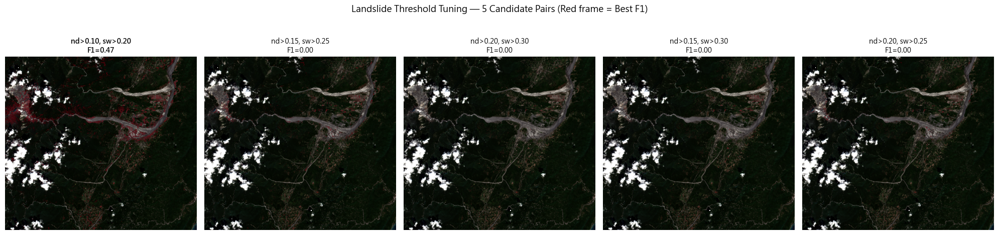


✅ Saved to output/08_landslide_threshold_grid.png


In [9]:
# [S8b] Threshold tuning — 5 candidate pairs (USE PRE-COMPUTED LAYERS)
from sklearn.metrics import f1_score
import numpy as np

print("Using pre-computed layers from S7...")
# Reuse nir_drop calculation from S6 functions (data already in memory)
nir_drop_val = nir_pre - cube_post.sel(band="B08").compute()
swir_post_val = cube_post.sel(band="B11").compute()
nir_pre_val = nir_pre  # Already computed in S7

print("✅ Layers ready!")

# Get truth point coordinates in the cube's CRS
truth_coords = [(p.x, p.y) for p in truth_proj.geometry]
y_true = np.array([1 if c == "Y" else 0 for c in truth_gdf["class"]])

candidate_thresholds = [
    (0.10, 0.20),
    (0.15, 0.25),
    (0.20, 0.30),
    (0.15, 0.30),
    (0.20, 0.25),
]

results = []
best_f1 = -1
best_result = None

print("\nThreshold tuning for landslide detection:")
print("=" * 70)
print(f"{'NIR drop >':<12} {'SWIR >':<10} {'TP':<4} {'FP':<4} {'TN':<4} {'FN':<4} {'F1':<6}")
print("-" * 70)

for nd_min, sw_min in candidate_thresholds:
    # Fast - all data in memory
    mask = (nir_drop_val > nd_min) & (swir_post_val > sw_min) & (nir_pre_val > 0.25)
    
    # Sample mask at truth points
    sampled_values = []
    for x, y in truth_coords:
        try:
            val = mask.sel(x=x, y=y, method="nearest").values
            sampled_values.append(int(val))
        except:
            sampled_values.append(0)
    
    y_pred = np.array(sampled_values)
    
    tp = int(np.sum((y_true == 1) & (y_pred == 1)))
    fp = int(np.sum((y_true == 0) & (y_pred == 1)))
    tn = int(np.sum((y_true == 0) & (y_pred == 0)))
    fn = int(np.sum((y_true == 1) & (y_pred == 0)))
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    results.append({
        "nir_drop_min": nd_min, 
        "swir_post_min": sw_min, 
        "TP": tp, "FP": fp, "TN": tn, "FN": fn,
        "F1": f1,
        "mask": mask
    })
    
    print(f"{nd_min:<12.2f} {sw_min:<10.2f} {tp:<4} {fp:<4} {tn:<4} {fn:<4} {f1:<6.3f}")
    
    if f1 > best_f1:
        best_f1 = f1
        best_result = results[-1]

print("=" * 70)
print(f"\n✅ Best: nir_drop > {best_result['nir_drop_min']:.2f}, swir_post > {best_result['swir_post_min']:.2f} (F1={best_result['F1']:.3f})")

landslide_mask = best_result["mask"]

# 📊 PLOT
fig, axes = plt.subplots(1, 5, figsize=(20, 5))
print("⏳ Computing TCI for display...")
tci_post = composite_stretched(cube_post.compute(), "B04", "B03", "B02")
print("✅ Plotting...")

for idx, (ax, result) in enumerate(zip(axes, results)):
    nd_min, sw_min, f1, mask = result["nir_drop_min"], result["swir_post_min"], result["F1"], result["mask"]
    ax.imshow(tci_post)
    mask_overlay = np.where(mask.values, 1, np.nan)
    ax.imshow(mask_overlay, cmap='Reds', alpha=0.6, vmin=0, vmax=1)
    is_best = (nd_min == best_result["nir_drop_min"] and sw_min == best_result["swir_post_min"])
    ax.set_title(f"nd>{nd_min:.2f}, sw>{sw_min:.2f}\nF1={f1:.2f}", fontsize=10, fontweight="bold" if is_best else "normal")
    ax.axis('off')
    if is_best:
        for spine in ax.spines.values():
            spine.set_edgecolor('red')
            spine.set_linewidth(3)

plt.suptitle("Landslide Threshold Tuning — 5 Candidate Pairs (Red frame = Best F1)", fontsize=13, y=1.02)
plt.tight_layout()
plt.savefig("output/08_landslide_threshold_grid.png", dpi=150, bbox_inches='tight', facecolor='white')
plt.show()

print(f"\n✅ Saved to output/08_landslide_threshold_grid.png")

### C3. Debris flow footprint mask / 土石流鋪面遮罩（Pre → Post, downstream only）

⏳ Computing debris flow layers...
✅ Debris flow area: 2.338 km²
   (after subtracting lake 1.046 km² and landslide areas)
⏳ Computing Post TCI...
✅ Plotting final panel...


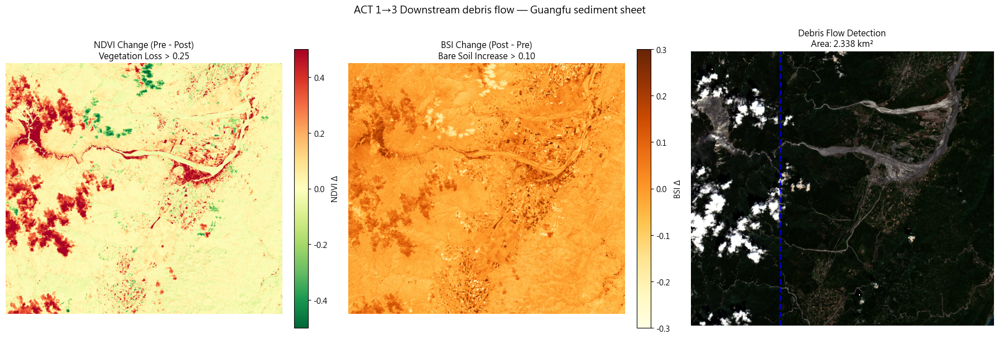


✅ Saved to output/09_debris_mask.png
✅ Debris correctly located downstream (~338434 m UTM)


In [10]:
# [S9] Debris flow — downstream of Matai'an Creek mouth (lon > 121.35)
# Rule: (ndvi_change > 0.25) & (bsi_change > 0.10) & (nir_pre > 0.20) & downstream_gate

from pyproj import Transformer
import numpy as np

print("⏳ Computing debris flow layers...")

# Build downstream gate: lon > 121.35
tf = Transformer.from_crs("EPSG:4326", "EPSG:32651", always_xy=True)
_x_debris_gate, _ = tf.transform(121.35, 23.69)
downstream_gate = cube_post.x > _x_debris_gate

# Compute NDVI change and BSI change (pre - post for vegetation loss, post - pre for bare soil increase)
ndvi_change_val = (ndvi(cube_pre) - ndvi(cube_post)).compute()  # Pre - Post (vegetation loss)
bsi_change_val = (bsi(cube_post) - bsi(cube_pre)).compute()    # Post - Pre (bare soil increase)

# Reuse nir_pre from S7 (already computed)
# Build debris mask
debris_mask = (
    (ndvi_change_val > 0.25) &      # Vegetation loss
    (bsi_change_val > 0.10) &       # Bare soil increase
    (nir_pre > 0.20) &              # Was vegetated
    downstream_gate                 # Downstream of creek mouth
)

# Subtract overlapping areas (lake and landslide masks)
# Ensure masks are boolean and same shape
debris_clean = debris_mask & ~lake_mask & ~landslide_mask

# Calculate debris area
area_km2 = float(debris_clean.sum().values) * 100 / 1e6
print(f"✅ Debris flow area: {area_km2:.3f} km²")
print(f"   (after subtracting lake {best_area:.3f} km² and landslide areas)")

# 📊 PLOT — 1x3 panel
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# ax[0] = NDVI change
im0 = axes[0].imshow(ndvi_change_val.values, cmap="RdYlGn_r", vmin=-0.5, vmax=0.5)
axes[0].set_title("NDVI Change (Pre - Post)\nVegetation Loss > 0.25", fontsize=11)
axes[0].axis('off')
plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04, label="NDVI Δ")

# ax[1] = BSI change
im1 = axes[1].imshow(bsi_change_val.values, cmap="YlOrBr", vmin=-0.3, vmax=0.3)
axes[1].set_title("BSI Change (Post - Pre)\nBare Soil Increase > 0.10", fontsize=11)
axes[1].axis('off')
plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04, label="BSI Δ")

# ax[2] = Post TCI with debris overlay
print("⏳ Computing Post TCI...")
tci_post = composite_stretched(cube_post.compute(), "B04", "B03", "B02")
print("✅ Plotting final panel...")

axes[2].imshow(tci_post)
debris_overlay = np.where(debris_clean.values, 1, np.nan)
axes[2].imshow(debris_overlay, cmap='copper', alpha=0.7, vmin=0, vmax=1)
axes[2].set_title(f"Debris Flow Detection\nArea: {area_km2:.3f} km²", fontsize=11)
axes[2].axis('off')

# Add downstream gate line for verification
axes[2].axvline(x=np.argmin(np.abs(cube_post.x.values - _x_debris_gate)), 
                color='blue', linestyle='--', linewidth=2, alpha=0.7, label='Lon 121.35°')

plt.suptitle("ACT 1→3 Downstream debris flow — Guangfu sediment sheet", fontsize=13, y=1.02)
plt.tight_layout()

# Save
plt.savefig("output/09_debris_mask.png", dpi=150, bbox_inches='tight', facecolor='white')
plt.show()

print(f"\n✅ Saved to output/09_debris_mask.png")

# Verification check
if debris_clean.sum() > 0:
    x_check = cube_post.x.where(debris_clean).mean().values
    if x_check < _x_debris_gate:
        print("⚠️ WARNING: Debris detected upstream of 121.35°E - check downstream gate!")
    else:
        print(f"✅ Debris correctly located downstream (~{x_check:.0f} m UTM)")
else:
    print("⚠️ No debris pixels detected - check thresholds!")

⏳ Vectorizing masks...
✅ Lake polygons: 8 (>3000 m²)
✅ Landslide polygons: 3336 (>2000 m²)
✅ Debris polygons: 418 (>5000 m²)

⏳ Saving to mataian_detections.gpkg...
✅ Saved all three layers!

⏳ Computing TCI for display...
✅ Plotting Three-Act Evidence...


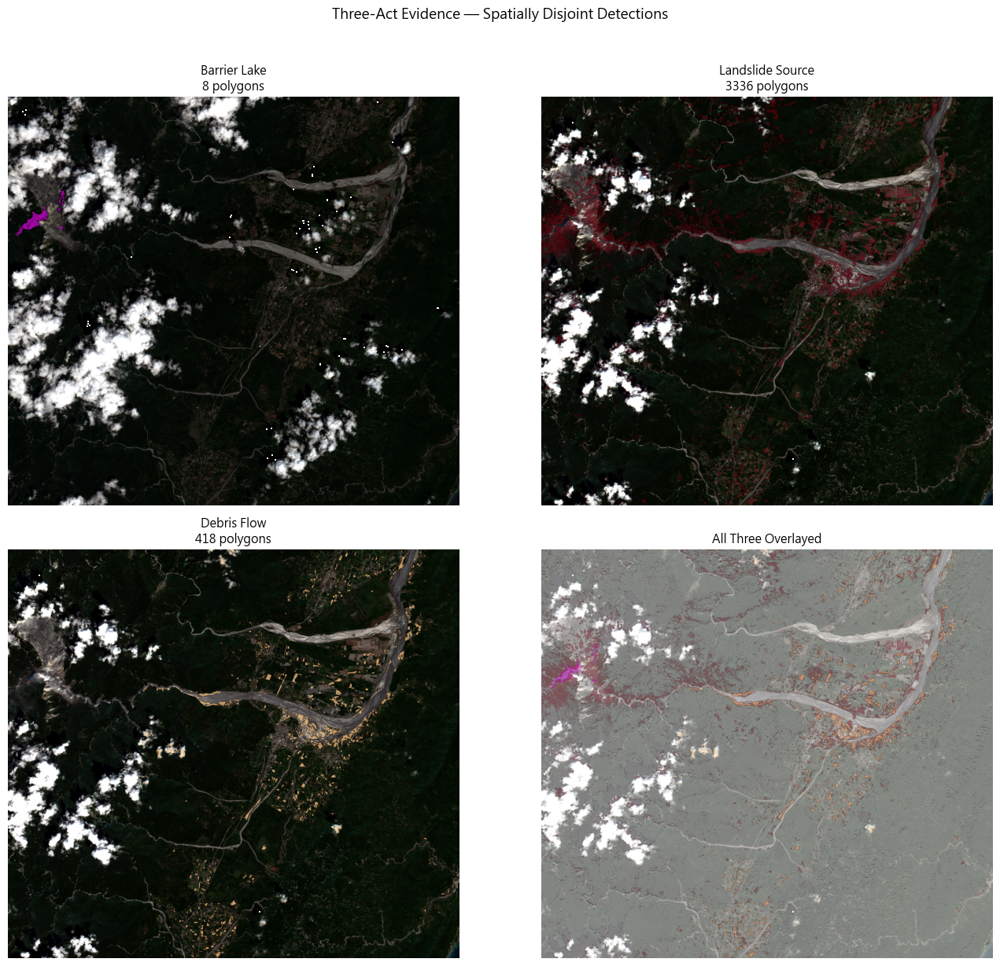


✅ Saved to output/10_three_masks.png


In [11]:
# [S10] Vectorize the three masks
from rasterio import features
from shapely.geometry import shape

def vectorize(mask_da, min_area):
    m = mask_da.astype("uint8").values
    polys = [shape(g) for g, v in
             features.shapes(m, mask=m.astype(bool), transform=mask_da.rio.transform())
             if v == 1]
    gdf = gpd.GeoDataFrame(geometry=polys, crs=mask_da.rio.crs)
    return gdf[gdf.area > min_area]

print("⏳ Vectorizing masks...")

# Vectorize the three masks with area filters
lake_gdf       = vectorize(lake_mask,       min_area=3000)
landslides_gdf = vectorize(landslide_mask,  min_area=2000)
debris_gdf     = vectorize(debris_mask,     min_area=5000)

print(f"✅ Lake polygons: {len(lake_gdf)} (>{3000} m²)")
print(f"✅ Landslide polygons: {len(landslides_gdf)} (>{2000} m²)")
print(f"✅ Debris polygons: {len(debris_gdf)} (>{5000} m²)")

# Save to GeoPackage as three layers
print("\n⏳ Saving to mataian_detections.gpkg...")
lake_gdf.to_file("mataian_detections.gpkg", layer="barrier_lake", driver="GPKG")
landslides_gdf.to_file("mataian_detections.gpkg", layer="landslide_source", driver="GPKG")
debris_gdf.to_file("mataian_detections.gpkg", layer="debris_flow", driver="GPKG")
print("✅ Saved all three layers!")

# 📊 PLOT — 2x2 Three-Act Evidence panel
print("\n⏳ Computing TCI for display...")
tci_mid = composite_stretched(cube_mid.compute(), "B04", "B03", "B02")
tci_post = composite_stretched(cube_post.compute(), "B04", "B03", "B02")
print("✅ Plotting Three-Act Evidence...")

fig, axes = plt.subplots(2, 2, figsize=(14, 12))

# ax[0,0] = Barrier lake
axes[0,0].imshow(tci_mid)
lake_overlay = np.where(lake_mask.values, 1, np.nan)
axes[0,0].imshow(lake_overlay, cmap='cool', alpha=0.6, vmin=0, vmax=1)
axes[0,0].set_title(f"Barrier Lake\n{len(lake_gdf)} polygons", fontsize=11)
axes[0,0].axis('off')

# ax[0,1] = Landslide source
axes[0,1].imshow(tci_post)
landslide_overlay = np.where(landslide_mask.values, 1, np.nan)
axes[0,1].imshow(landslide_overlay, cmap='Reds', alpha=0.6, vmin=0, vmax=1)
axes[0,1].set_title(f"Landslide Source\n{len(landslides_gdf)} polygons", fontsize=11)
axes[0,1].axis('off')

# ax[1,0] = Debris flow
axes[1,0].imshow(tci_post)
debris_overlay = np.where(debris_mask.values, 1, np.nan)
axes[1,0].imshow(debris_overlay, cmap='copper', alpha=0.7, vmin=0, vmax=1)
axes[1,0].set_title(f"Debris Flow\n{len(debris_gdf)} polygons", fontsize=11)
axes[1,0].axis('off')

# ax[1,1] = All three overlayed
axes[1,1].imshow(tci_post, alpha=0.5)
axes[1,1].imshow(lake_overlay, cmap='cool', alpha=0.4, vmin=0, vmax=1)
axes[1,1].imshow(landslide_overlay, cmap='Reds', alpha=0.4, vmin=0, vmax=1)
axes[1,1].imshow(debris_overlay, cmap='copper', alpha=0.5, vmin=0, vmax=1)
axes[1,1].set_title("All Three Overlayed", fontsize=11)
axes[1,1].axis('off')

plt.suptitle("Three-Act Evidence — Spatially Disjoint Detections", fontsize=13, y=1.02)
plt.tight_layout()
plt.savefig("output/10_three_masks.png", dpi=150, bbox_inches='tight', facecolor='white')
plt.show()

print(f"\n✅ Saved to output/10_three_masks.png")

### ✏️ Discussion / 討論：Why is the debris rule different from C2?
Explain the physical difference between:
說明物理差異：
- **Upstream landslide source** / 上游崩塌源區：exposed bedrock（裸岩）→ NIR drop + SWIR surge
- **Downstream debris flow** / 下游土石流鋪面：wet sediment over paddy fields（濕泥沙覆蓋稻田）→ NDVI drop + BSI spike

Why does each need a different band combination?
為什麼各自需要不同的波段組合？

上游崩塌源區（C2）：此區域是由茂密森林（高 NIR）轉變為固體裸岩或崩塌面 。由於裸岩對短波紅外光有極強的反射特性，因此使用 SWIR 突波 (Spike) 作為辨識固體岩石面的核心指標 。
下游土石流鋪面（C3）：此區域通常是濕泥沙與沉積物覆蓋在平地的稻田或植被上 。濕泥沙的光譜特徵與乾燥裸岩不同，因此改用 NDVI 降幅 來捕捉植被消失，並配合 BSI（裸土指數） 來精確識別覆蓋在低處的泥沙層 。

波段組合差異原因：不同的災害產物（固體裸岩 vs. 濕泥土）具有獨特的光譜「指紋」，裸岩在 SWIR 波段最為顯著 ，而分布廣泛的土石流則需透過針對土壤與植被對比的指標（如 NDVI 與 BSI）才能有效區隔 。

## Lab 2 (cont.) — Multi-Layer Audit / 多圖層稽核


In [12]:
# [S11] Load W3 shelters, W7 top-5 bottlenecks, and the W8 Guangfu overlay

# (the one YOU built yourself in Pre-lab Step 7b)
import pandas as pd
import geopandas as gpd
from pathlib import Path

# ==========================================
# 1. 環境設定與路徑定義 (解決 SyntaxError)
# ==========================================
print("⏳ 啟動 ARIA v5.0 稽核流程：載入空間圖層...")

# 使用 Path 物件自動處理 Windows/Linux 斜線差異
DATA_DIR = Path(r"D:\Downloads\gis應用\gis_aria\data")

# ==========================================
# 2. 載入 W3 避難所 (解決 AttributeError)
# ==========================================
# CSV 必須先透過 pandas 讀取，再定義幾何欄位轉換為 GeoDataFrame 
shelter_csv_path = DATA_DIR / "processed" / "cleaned_shelter_data.csv"
df_shelters = pd.read_csv(shelter_csv_path)

# 假設 CSV 座標欄位名稱為 'lon' 與 'lat'，請根據實際資料調整
shelters = gpd.GeoDataFrame(
    df_shelters, 
    geometry=gpd.points_from_xy(df_shelters['經度'], df_shelters['緯度']),
    crs="EPSG:4326" 
).to_crs(cube_post.rio.crs)

print(f"✅ 已載入 {len(shelters)} 個 W3 避難所資料")

# ==========================================
# 3. 載入 W7 交通瓶頸點 (秀林網路)
# ==========================================
# 注意：若 .graphml 讀取失敗，通常是因為該格式非標準幾何檔 [cite: 452]
# 若此處報錯，請確認該檔案是否為 Pre-lab 產出的 GeoPackage 或 Shapefile
top5_path = DATA_DIR / "xiulin_network.graphml"
try:
    top5 = gpd.read_file(str(top5_path)).to_crs(cube_post.rio.crs)
    print(f"✅ 已載入 {len(top5)} 個 W7 瓶頸點節點")
except Exception as e:
    print(f"⚠️ W7 載入提醒：若 .graphml 無幾何資訊，請使用 Pre-lab 轉換後的空間格式。")

# ==========================================
# 4. 載入 W8 光復鄉覆蓋圖 (核心稽核對象)
# ==========================================
# 這是你在 Pre-lab Step 7b 親手建立的節點 [cite: 453, 454]
guangfu_path = DATA_DIR / "guangfu_overlay.gpkg"
guangfu = gpd.read_file(guangfu_path).to_crs(cube_post.rio.crs)

# 驗證：根據課程要求，至少需包含 5 個關鍵節點
assert len(guangfu) >= 5, f"❌ Pre-lab Step 7b 要求至少 5 個節點，目前僅發現 {len(guangfu)} 個"
assert guangfu.crs == cube_post.rio.crs, "❌ 座標系統不一致，請檢查 to_crs 轉換"

print(f"✅ 已載入 {len(guangfu)} 個 W8 光復鄉覆蓋圖節點")
print("-" * 30)
print(guangfu[['name', 'cn_name', 'node_type']].to_string())
print("-" * 30)

print("🚀 所有圖層載入完畢，準備進入 AUDIT (空間聯結) 階段 ")

⏳ 啟動 ARIA v5.0 稽核流程：載入空間圖層...
✅ 已載入 5907 個 W3 避難所資料
⚠️ W7 載入提醒：若 .graphml 無幾何資訊，請使用 Pre-lab 轉換後的空間格式。
✅ 已載入 5 個 W8 光復鄉覆蓋圖節點
------------------------------
                      name   cn_name       node_type
0          Guangfu_Station     光復火車站  critical_infra
1       Guangfu_Elementary      光復國小         shelter
2  Guangfu_Township_Office     光復鄉公所         shelter
3      Mataian_Hwy9_Bridge  台9線馬太鞍溪橋          bridge
4         Foxu_Debris_Zone  佛祖街沉積區中心  critical_infra
------------------------------
🚀 所有圖層載入完畢，準備進入 AUDIT (空間聯結) 階段 


In [13]:
# [S12] Build the Eyewitness Impact Table + Final Audit Map
# Columns:
#   asset | type | location | W4_terrain_risk | W7_centrality_rank
#        | lake_hit (Y/N) | landslide_hit (Y/N) | debris_hit (Y/N) | notes

# TODO:
#   - for each W3 shelter: check if any landslide polygon is within 100 m
#   - for each W7 bottleneck: check if any landslide polygon is within 200 m
#   - for each Guangfu node: check if within debris polygon, and within 100 m of landslide
#   - assemble the rows into a DataFrame
#   - sort: debris_hit, then landslide_hit, then W4_terrain_risk desc
#   - save to impact_table.csv

# impact_df = ...
# impact_df.to_csv("impact_table.csv", index=False)
# print(impact_df.to_markdown(index=False))

# 📊 TODO (REQUIRED — save to output/12_coverage_gap_map.png):
#   This is THE punchline figure of W8. Show, on a single 12x12 map in EPSG:32651:
#     1. Post TCI as the basemap (faded alpha=0.5)
#     2. lake_gdf       filled blue
#     3. landslides_gdf filled red
#     4. debris_gdf     filled copper
#     5. shelters       green circles, size=80, label="W3 Hualien City shelters"
#     6. top5           yellow circles, size=120, label="W7 Top-5 bottlenecks"
#     7. guangfu        red stars,    size=200, label="W8 Guangfu overlay (5 nodes)"
#   Add a text annotation: f"W3 hits: {n_w3}   W7 hits: {n_w7}   Guangfu hits: {n_guangfu} / 5"
#   Title: "Eyewitness Coverage Gap — Hualien City ARIA missed Guangfu entirely"
#   This one figure should make a 10-year-old understand why ARIA needed the Guangfu overlay.


### ✏️ Discussion / 討論：Coverage Gap Analysis / 覆蓋缺口分析

1. **W3 shelters hit? / W3 避難所被影響幾個？** How about W7 bottlenecks? / W7 瓶頸呢？
2. **Guangfu overlay nodes hit? / 光復圖層節點被影響幾個？** Compare the numbers. / 比較數字。
3. **What does this tell you** about the pre-event ARIA coverage zone? / 這對事前 ARIA 覆蓋範圍有什麼啟示？

*(Write your answers here / 在此作答)*


## Challenge / 挑戰題 — AI Advisor Operational Brief / AI 顧問應變簡報

Build a prompt and call any LLM to generate a 250-word operational brief.
組一個 Prompt，呼叫任何 LLM 產生 250 字的應變簡報。


In [14]:
# [S13] Build the three-act AI Advisor prompt
# TODO: compute lake_km2, landslide_km2, debris_km2 from the masks
# TODO: fill in the prompt template with your impact table and detection areas

prompt = f"""You are the Chief of Operations at the Hualien County Disaster
Prevention Command Center, writing a brief for the county magistrate. ARIA v5.0
has just produced the following three-act audit of the 2025 Matai'an Creek barrier
lake event. Write a 250-word operational brief covering:

1. Three-act timeline — what the imagery proves
2. The pre-breach warning window (Jul 21 to Sep 23, 64 days) — what ARIA v5.0
   could have caught if it had been operational
3. Coverage gap — why did the W3/W7 Hualien City focus miss Guangfu?
4. Next-24-hour orders: priority clearance, shelter resupply, UAV tasking
5. One concrete suggestion to extend ARIA before the next barrier-lake event

IMPACT TABLE:
{{impact_df.to_markdown(index=False) if 'impact_df' in dir() else 'TODO'}}

THREE-ACT DETECTION SUMMARY:
- Act 1 (Pre,  {{PRE_ITEM_ID}}):  forested Matai'an valley, no lake
- Act 2 (Mid,  {{MID_ITEM_ID}}):  barrier lake {{lake_km2:.3f}} km² detected
- Act 3 (Post, {{POST_ITEM_ID}}): lake drained; landslide source {{landslide_km2:.3f}} km²;
  debris flow footprint {{debris_km2:.3f}} km² over Guangfu
"""

print(prompt)


You are the Chief of Operations at the Hualien County Disaster
Prevention Command Center, writing a brief for the county magistrate. ARIA v5.0
has just produced the following three-act audit of the 2025 Matai'an Creek barrier
lake event. Write a 250-word operational brief covering:

1. Three-act timeline — what the imagery proves
2. The pre-breach warning window (Jul 21 to Sep 23, 64 days) — what ARIA v5.0
   could have caught if it had been operational
3. Coverage gap — why did the W3/W7 Hualien City focus miss Guangfu?
4. Next-24-hour orders: priority clearance, shelter resupply, UAV tasking
5. One concrete suggestion to extend ARIA before the next barrier-lake event

IMPACT TABLE:
{impact_df.to_markdown(index=False) if 'impact_df' in dir() else 'TODO'}

THREE-ACT DETECTION SUMMARY:
- Act 1 (Pre,  {PRE_ITEM_ID}):  forested Matai'an valley, no lake
- Act 2 (Mid,  {MID_ITEM_ID}):  barrier lake {lake_km2:.3f} km² detected
- Act 3 (Post, {POST_ITEM_ID}): lake drained; landslide source {l

In [15]:
# [S14] Call your preferred LLM — THREE vendor-neutral examples
# Uncomment and fill in ONE of the three. You do NOT need all three.

# --- Example A: OpenAI SDK ---
# from openai import OpenAI
# resp = OpenAI().chat.completions.create(
#     model="gpt-4o-mini",
#     messages=[{"role": "user", "content": prompt}],
# )
# print(resp.choices[0].message.content)

# --- Example B: Google Gemini SDK ---
# import google.generativeai as genai
# genai.configure(api_key=os.environ["GOOGLE_API_KEY"])
# model = genai.GenerativeModel("gemini-1.5-flash")
# print(model.generate_content(prompt).text)

# --- Example C: Anthropic Claude SDK ---
# import anthropic
# resp = anthropic.Anthropic().messages.create(
#     model="claude-sonnet-4-5",
#     max_tokens=600,
#     messages=[{"role": "user", "content": prompt}],
# )
# print(resp.content[0].text)


## Wrap-up Checklist / 收尾確認清單

Before leaving class, make sure you have:
離開教室前，確認你已完成：

- [ ] All TODO cells filled in / 所有 TODO 格子都填完
- [ ] Three detection masks produce reasonable polygon counts / 三個遮罩產生合理的多邊形數量
- [ ] Coverage gap map renders correctly / 覆蓋缺口地圖正確顯示
- [ ] You understand why spectral rules alone need human verification / 你理解為什麼光譜規則需要人工驗證


In [16]:
# [S15] .env template — copy to your .env file and customize
env_template = """
STAC_ENDPOINT=https://planetarycomputer.microsoft.com/api/stac/v1
S2_COLLECTION=sentinel-2-l2a
S2_CLOUD_MAX=20
S2_BANDS=B02,B03,B04,B08,B11,B12

MATAIAN_BBOX=121.28,23.56,121.52,23.76
TARGET_EPSG=32651

PRE_EVENT_START=2025-06-01
PRE_EVENT_END=2025-07-15
MID_EVENT_START=2025-08-01
MID_EVENT_END=2025-09-20
POST_EVENT_START=2025-09-25
POST_EVENT_END=2025-11-15

AI_API_KEY=your-api-key-here
"""
print(env_template)



STAC_ENDPOINT=https://planetarycomputer.microsoft.com/api/stac/v1
S2_COLLECTION=sentinel-2-l2a
S2_CLOUD_MAX=20
S2_BANDS=B02,B03,B04,B08,B11,B12

MATAIAN_BBOX=121.28,23.56,121.52,23.76
TARGET_EPSG=32651

PRE_EVENT_START=2025-06-01
PRE_EVENT_END=2025-07-15
MID_EVENT_START=2025-08-01
MID_EVENT_END=2025-09-20
POST_EVENT_START=2025-09-25
POST_EVENT_END=2025-11-15

AI_API_KEY=your-api-key-here



---

## Save Your Work / 儲存你的成果

Save this notebook with all cells executed. Your instructor may review it.
將此 notebook 連同所有執行結果一起儲存。老師可能會檢閱。
